## build the dataset from multiple source files

In [1]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import h5py
import random

import sys
sys.path.append('../../../src')
from viz import show_images
from Velocity import VelocityCalculator

sys.path.append('../../../src/DL')
from make_dataset import EqualRangeNormalizer, merge_h5_and_csv

In [2]:
# keys for the growth conditions
df_condition = pd.read_excel('../../../datasets/Sample log.xlsx', sheet_name='SRO')
df_condition = df_condition.loc[16:34, ['Growth', 'Pressure (mTorr)', 'Temperature (C)', 'Fluence (J/cm2)', 'Repetation rate (Hz)']]
df_condition['Growth'] = df_condition['Growth'].str.replace(r'LYW_YCG', 'YG', regex=True)
growth_names = df_condition['Growth'].unique()
print(growth_names)

['YG045' 'YG046' 'YG047' 'YG048' 'YG049' 'YG050' 'YG051' 'YG052' 'YG053'
 'YG054' 'YG055' 'YG056' 'YG057' 'YG058' 'YG059' 'YG060' 'YG061' 'YG062'
 'YG063']


### partial plume frames

19 19 19
loading D:/pld_plumes/SRO_STO_Drexel\YG045_YichenGuo_JulianGoddy_05092024.h5...


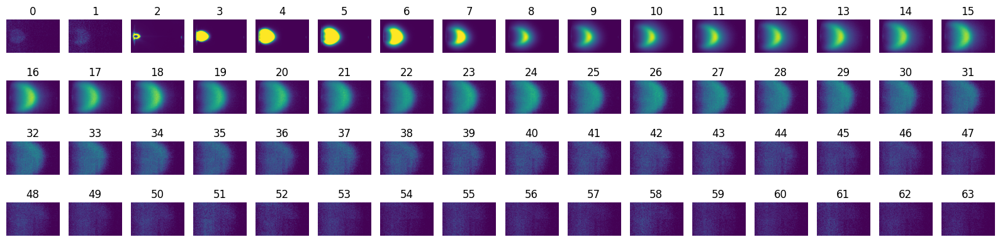

loading ../../../datasets/SRO_plume_metrics/YG045_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG046_YichenGuo_05162024.h5...


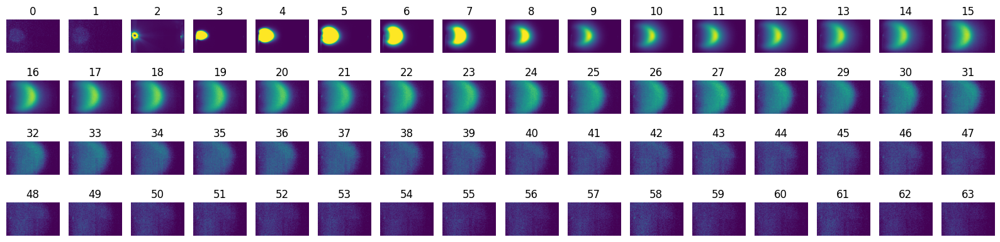

loading ../../../datasets/SRO_plume_metrics/YG046_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG047_YichenGuo_05172024.h5...


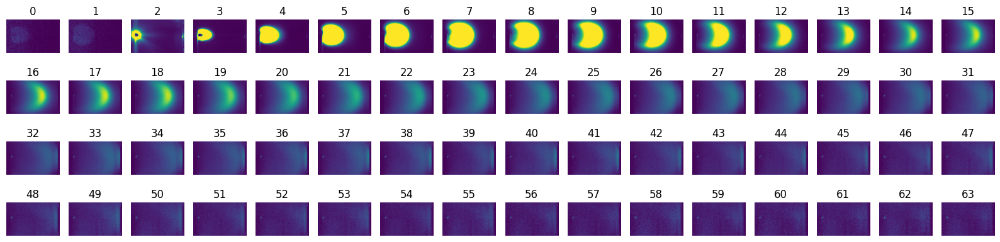

loading ../../../datasets/SRO_plume_metrics/YG047_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG048_YichenGuo_05302024.h5...


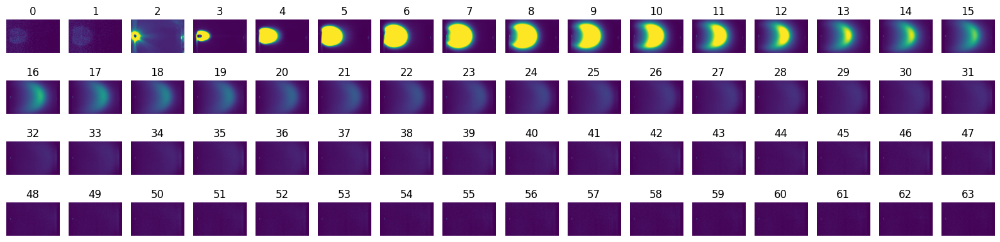

loading ../../../datasets/SRO_plume_metrics/YG048_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG049_YichenGuo_06032024.h5...


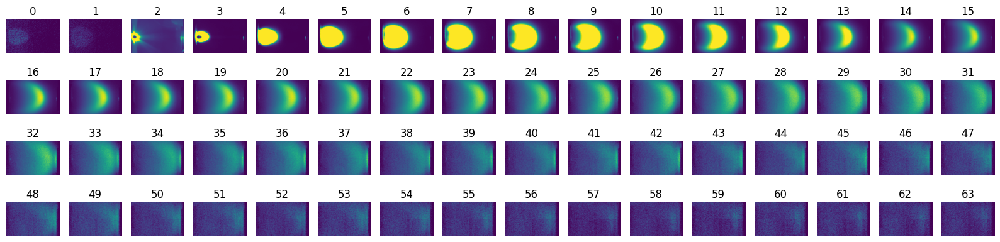

loading ../../../datasets/SRO_plume_metrics/YG049_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG050_YichenGuo_06052024.h5...


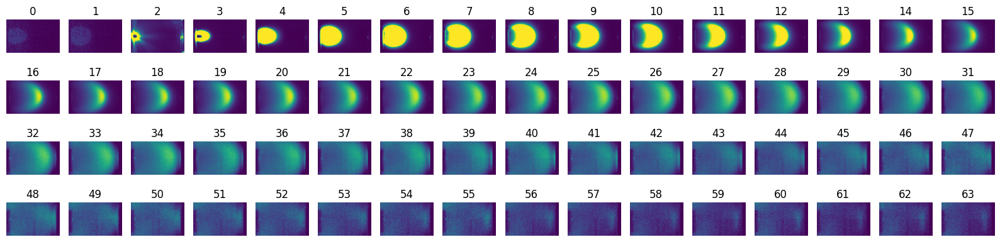

loading ../../../datasets/SRO_plume_metrics/YG050_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG051_YichenGuo_06122024.h5...


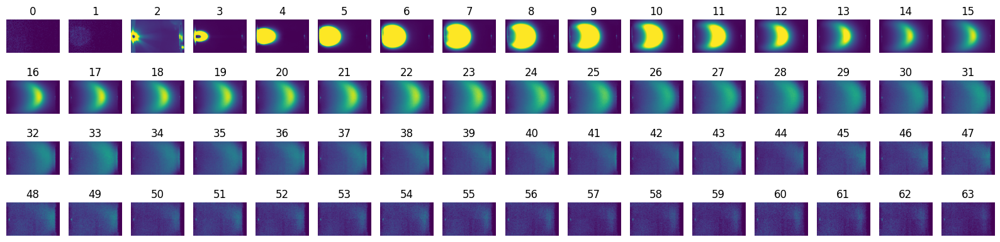

loading ../../../datasets/SRO_plume_metrics/YG051_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG052_YichenGuo_06142024.h5...


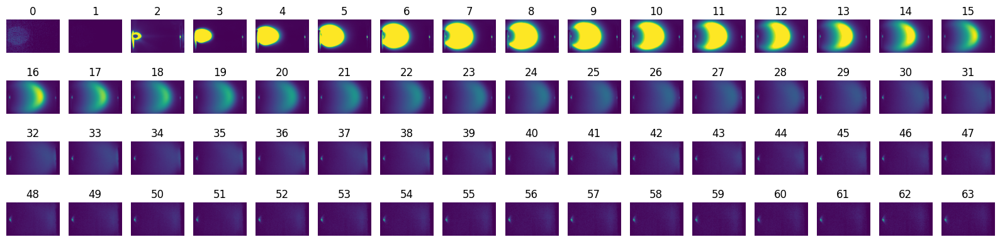

loading ../../../datasets/SRO_plume_metrics/YG052_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG053_YichenGuo_06172024.h5...


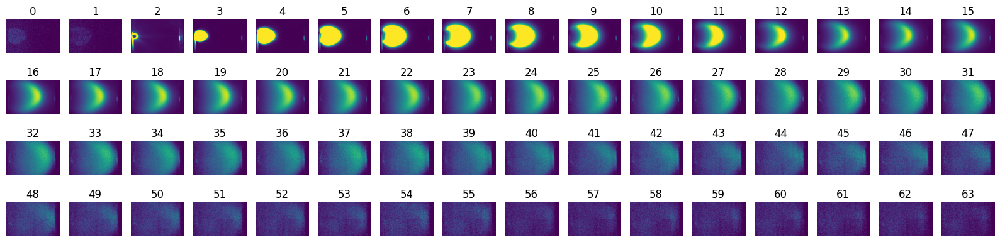

loading ../../../datasets/SRO_plume_metrics/YG053_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG054_YichenGuo_06252024.h5...


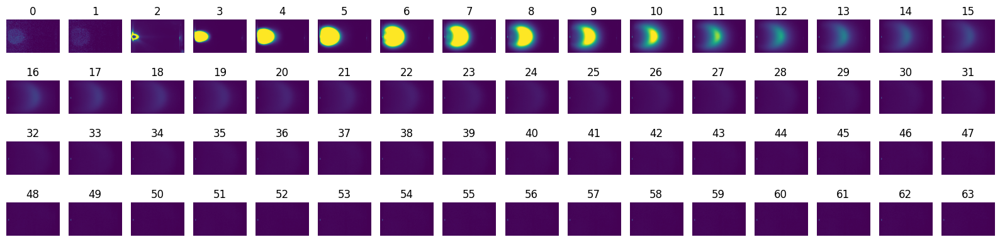

loading ../../../datasets/SRO_plume_metrics/YG054_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG055_YichenGuo_06262024.h5...


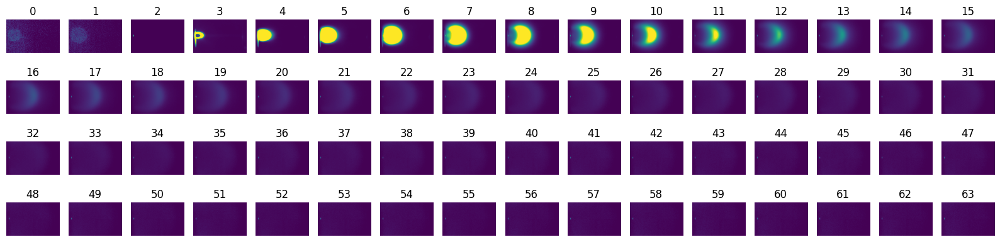

loading ../../../datasets/SRO_plume_metrics/YG055_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG056_YichenGuo_06282024.h5...


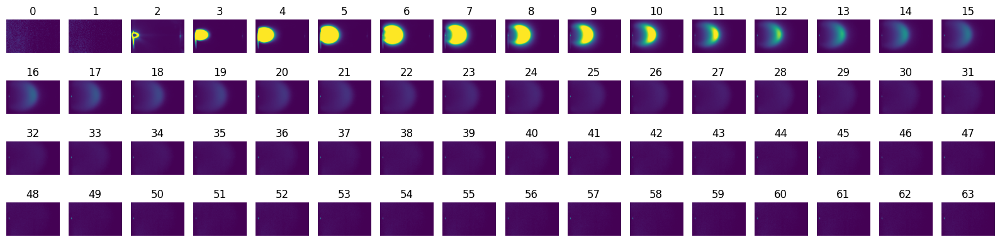

loading ../../../datasets/SRO_plume_metrics/YG056_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG057_YichenGuo_06282024.h5...


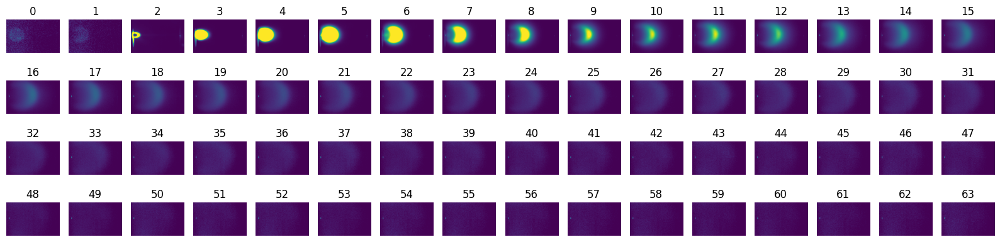

loading ../../../datasets/SRO_plume_metrics/YG057_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG058_YichenGuo_06292024.h5...


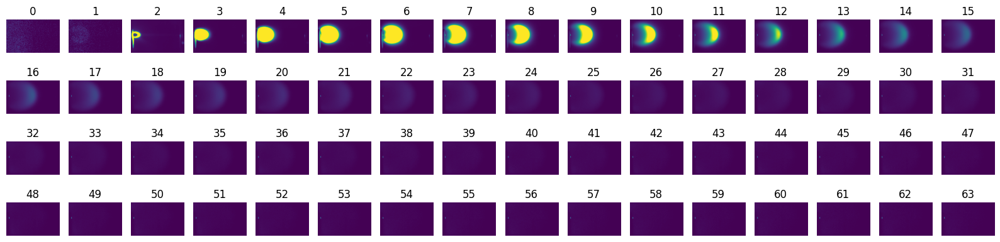

loading ../../../datasets/SRO_plume_metrics/YG058_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG059_YichenGuo_07012024.h5...


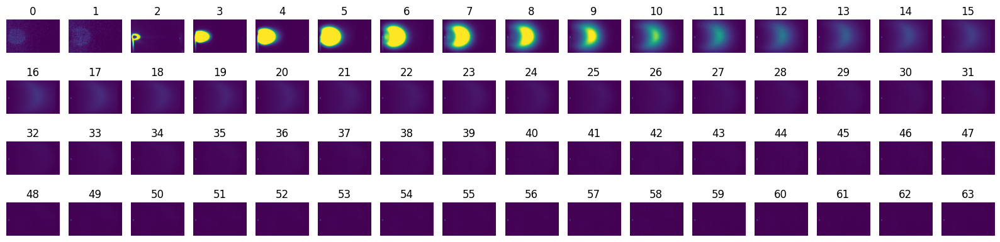

loading ../../../datasets/SRO_plume_metrics/YG059_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG060_YichenGuo_07032024.h5...


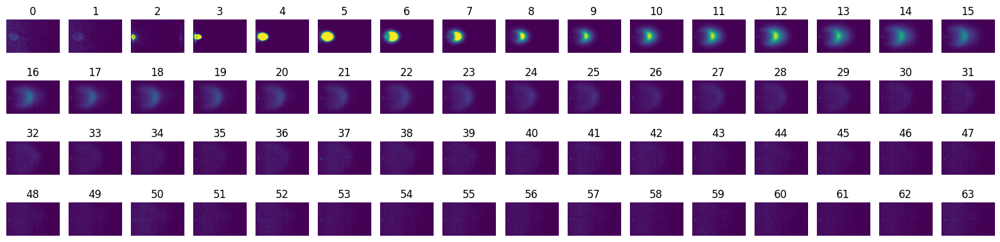

loading ../../../datasets/SRO_plume_metrics/YG060_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG061_YichenGuo_07042024.h5...


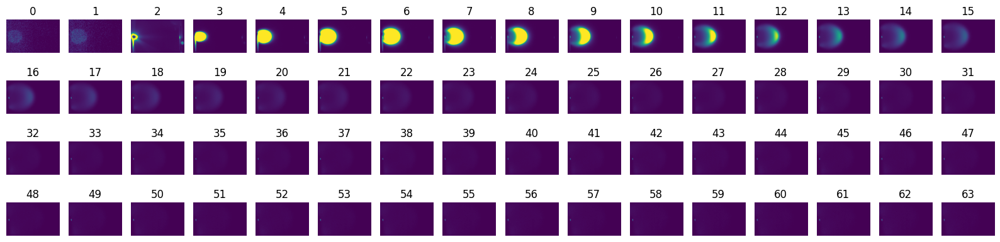

loading ../../../datasets/SRO_plume_metrics/YG061_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG062_YichenGuo_07052024.h5...


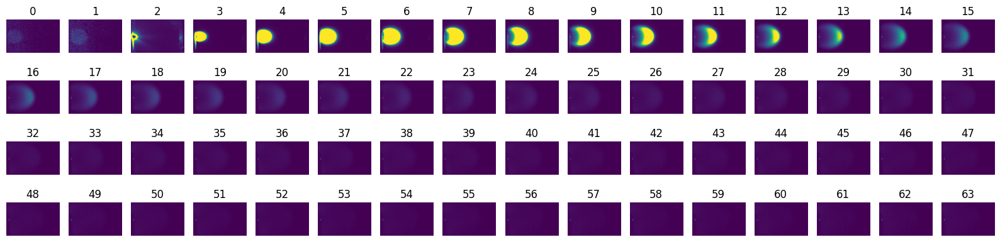

loading ../../../datasets/SRO_plume_metrics/YG062_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG063_YichenGuo_08042024.h5...


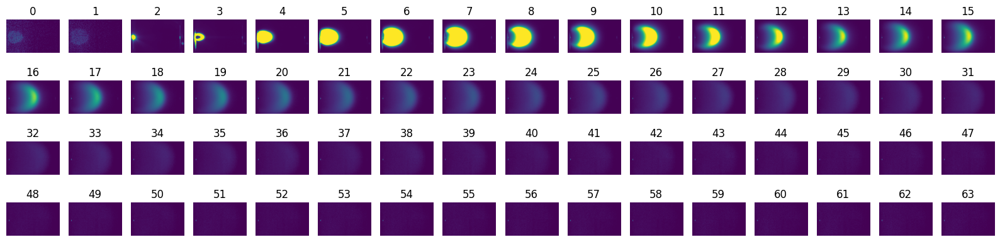

loading ../../../datasets/SRO_plume_metrics/YG063_metrics_with_conditions-efficiency.csv...
Merged 19 H5 files and 19 CSV files into D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063_short.h5
Total images: 0


In [5]:
# Example usage remains the same
h5_files, csv_files, coords_files = [], [], []
for key in growth_names:
    h5_files.append(glob.glob(f'D:/pld_plumes/SRO_STO_Drexel/{key}*.h5')[0])
    csv_files.append(glob.glob(f'../../../datasets/SRO_plume_metrics/{key}_metrics_with_conditions-efficiency.csv')[0])
    coords_files.append(glob.glob(f'../../../datasets/frame_normalization_coords/standard_coords.npy')[0])
print(len(h5_files), len(csv_files), len(coords_files))
coords_standard = np.load('../../../datasets/frame_normalization_coords/standard_coords.npy')
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063_short.h5'
frame_index_list = np.arange(0, 48, 1)
merge_h5_and_csv(h5_files, csv_files, coords_files, coords_standard, output_file, frame_index_list, viz_sample=True)

#### exam plumes

<KeysViewHDF5 ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Fluence (J per cm2)', 'Growth', 'Pressure (mTorr)', 'Repetation rate (Hz)', 'Temperature (C)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)', 'images', 'plume_index', 'time_index']>
(48640, 250, 400)


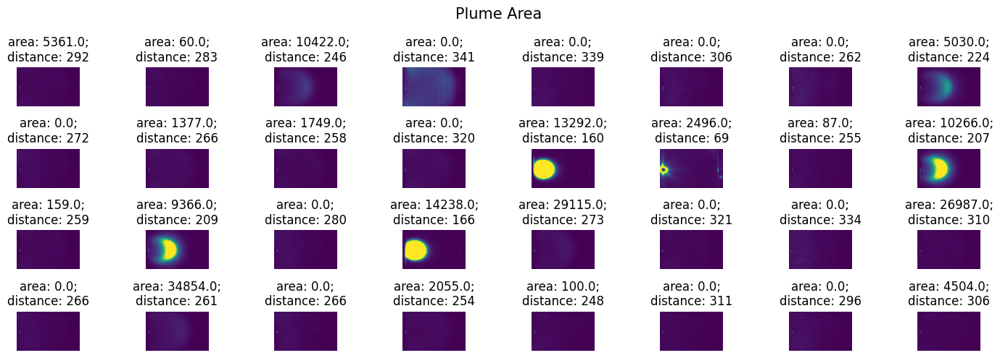

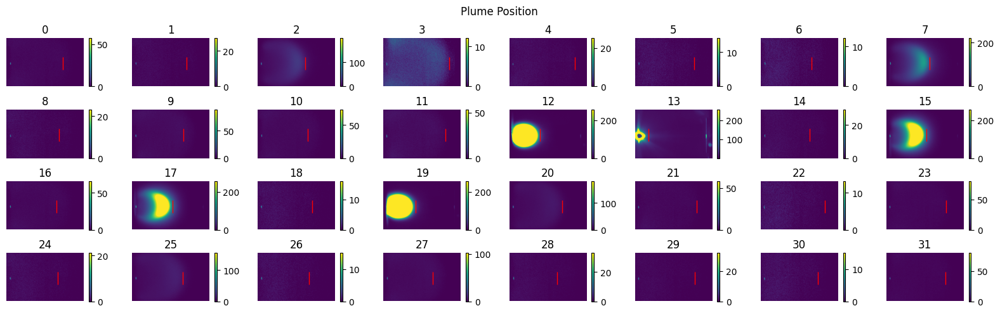

In [6]:
k = 32
with h5py.File(output_file, 'r') as f:
    print(f.keys())
    print(f['images'].shape)
    
    length = f.attrs['total_images']
    index_imgs = random.choices(range(length), k=k)
    index_imgs.sort()
    
    images = f['images'][index_imgs]
    distance = f['Distance(flexible)'][index_imgs]
    area = f['Area(flexible)'][index_imgs]
    labels = [f'area: {area[index]};\ndistance: {distance[index]}' for index in range(len(index_imgs))]
    
show_images(images, img_per_row=8, img_height=1, labels=labels, title='Plume Area')
plt.tight_layout()
plt.show()

coords_YG063 = np.array([[18,45], [20,209], [363,39], [364,223]])
start_position = np.round(np.mean(coords_YG063[:2], axis=0)).astype(np.int32) # start position of plume  (x, y)
position_range = np.min(coords_YG063[:,0]), np.max(coords_YG063[:,0]) # x position range
# retrieve the position from distance and y
y = int(np.mean(coords_YG063[:,1]))
ys = np.ones_like(distance) * y
positions = np.stack([distance, ys], axis=-1)

V = VelocityCalculator(time_interval=500e-9, start_position=start_position, position_range=position_range, threshold='flexible')
V.visualize_plume_positions(images, positions, label_time=False, title='Plume Position')

#### merge and create labels as dataset

In [7]:
label_keys, labels = [], []
with h5py.File(output_file, 'r') as h5:
    print(h5.keys())
    datasets = ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)']
    
    for k in datasets:
        print(k, h5[k].shape, h5[k].dtype)
        label_keys.append(k)
        labels.append(h5[k][:])
    labels = np.stack(labels, axis=-1)
    
with h5py.File(output_file, 'a') as h5:
    # h5.create_dataset('merged_labels', data=labels, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics', data=labels, dtype=np.float32)
    h5.attrs['label_keys'] = label_keys

<KeysViewHDF5 ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Fluence (J per cm2)', 'Growth', 'Pressure (mTorr)', 'Repetation rate (Hz)', 'Temperature (C)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)', 'images', 'plume_index', 'time_index']>
Area(200) (48640,) float64
Area(5) (48640,) float64
Area(flexible) (48640,) float64
Distance(200) (48640,) int64
Distance(5) (48640,) int64
Distance(flexible) (48640,) int64


#### normalize labels to same 0-1 range

In [8]:
with h5py.File(output_file, 'r') as h5:
    # labels = np.array(h5['merged_labels'])
    labels = np.array(h5['merged_plume_metrics'])
    label_keys = list(h5.attrs['label_keys'])
print(labels.shape, label_keys)

(48640, 6) ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)']


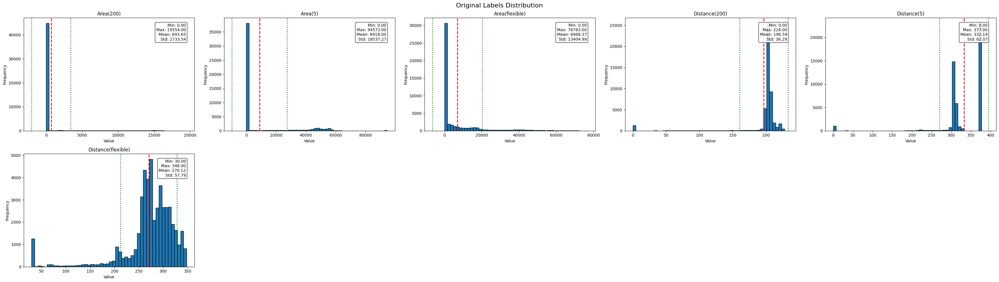

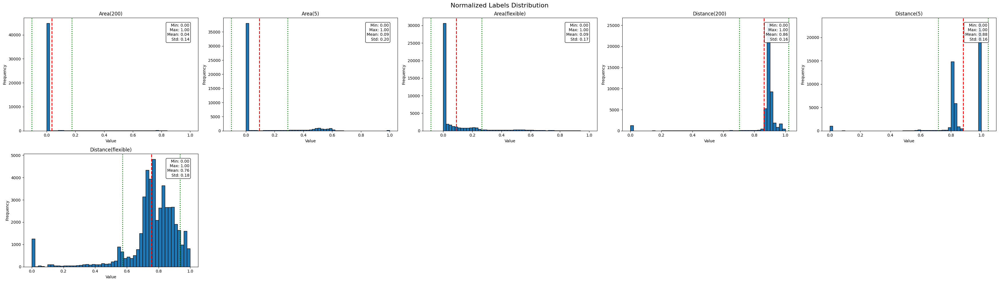

In [9]:
normalizer = EqualRangeNormalizer()
normalizer.fit(labels, label_keys, viz=True)
label_min, label_max = normalizer.min_vals, normalizer.max_vals
normalized_data = normalizer.transform(labels, label_keys, viz=True)

with h5py.File(output_file, 'a') as h5:
    h5.create_dataset('merged_plume_metrics_min', data=label_min, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics_max', data=label_max, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics_normalized', data=normalized_data, dtype=np.float32)

#### verify if it's recoverable

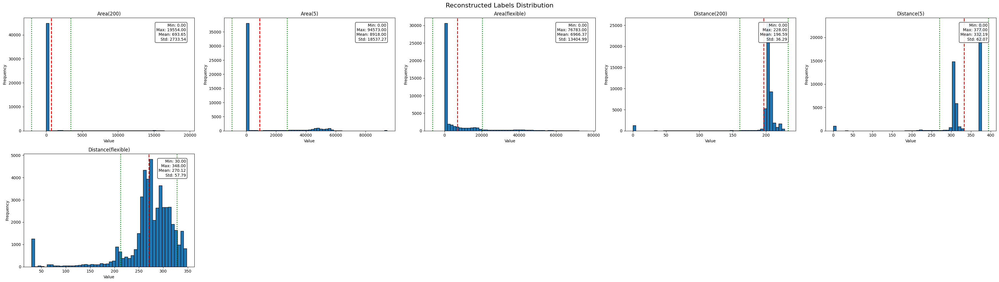

In [10]:
with h5py.File(output_file, 'r') as h5:
    merged_labels_min = np.array(h5['merged_plume_metrics_min'])
    merged_labels_max = np.array(h5['merged_plume_metrics_max'])
    merged_labels_normalized = np.array(h5['merged_plume_metrics_normalized'])

normalizer = EqualRangeNormalizer(min_vals=merged_labels_min, max_vals=merged_labels_max)
merged_labels = normalizer.inverse_transform(merged_labels_normalized, label_keys, viz=True)

### complete dataset

#### make datasets for only the plume

In [3]:
# Example usage remains the same
h5_files, csv_files, coords_files = [], [], []
for key in growth_names:
    h5_files.append(glob.glob(f'D:/pld_plumes/SRO_STO_Drexel/{key}*.h5')[0])
    csv_files.append(glob.glob(f'../../../datasets/SRO_plume_metrics/{key}_metrics_with_conditions-efficiency.csv')[0])
    coords_files.append(glob.glob(f'../../../datasets/frame_normalization_coords/standard_coords.npy')[0])
print(len(h5_files), len(csv_files), len(coords_files))
coords_standard = np.load('../../../datasets/frame_normalization_coords/standard_coords.npy')
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
merge_h5_and_csv(h5_files, csv_files, coords_files, coords_standard, output_file)

19 19 19
loading D:/pld_plumes/SRO_STO_Drexel\YG045_YichenGuo_JulianGoddy_05092024.h5...
loading ../../../datasets/SRO_plume_metrics/YG045_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG046_YichenGuo_05162024.h5...
loading ../../../datasets/SRO_plume_metrics/YG046_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG047_YichenGuo_05172024.h5...
loading ../../../datasets/SRO_plume_metrics/YG047_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG048_YichenGuo_05302024.h5...
loading ../../../datasets/SRO_plume_metrics/YG048_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG049_YichenGuo_06032024.h5...
loading ../../../datasets/SRO_plume_metrics/YG049_metrics_with_conditions-efficiency.csv...
loading D:/pld_plumes/SRO_STO_Drexel\YG050_YichenGuo_06052024.h5...
loading ../../../datasets/SRO_plume_metrics/YG050_metrics_with_conditions-efficiency.csv...
loading D:/pld_plum

#### exam plumes

<KeysViewHDF5 ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Fluence (J per cm2)', 'Growth', 'Pressure (mTorr)', 'Repetation rate (Hz)', 'Temperature (C)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)', 'images', 'plume_index', 'time_index']>
(48640, 250, 400)


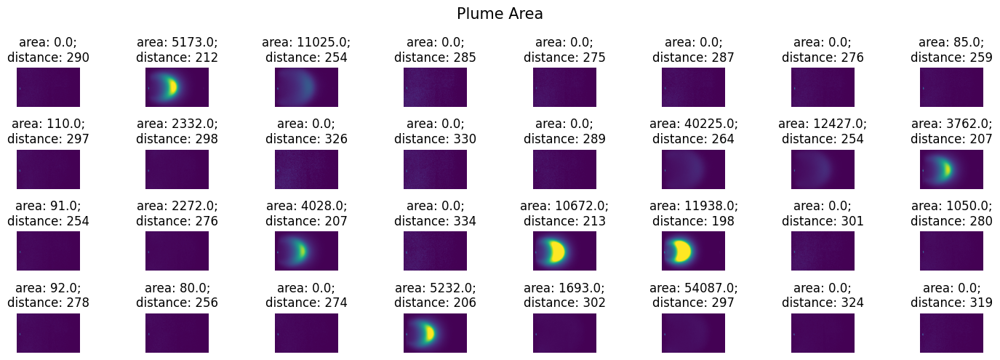

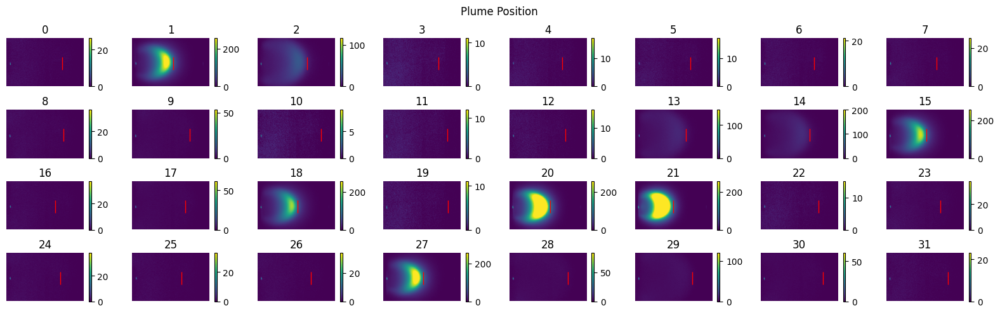

In [4]:
k = 32
with h5py.File('D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5', 'r') as f:
    print(f.keys())
    print(f['images'].shape)
    
    length = f.attrs['total_images']
    index_imgs = random.choices(range(length), k=k)
    index_imgs.sort()
    
    images = f['images'][index_imgs]
    distance = f['Distance(flexible)'][index_imgs]
    area = f['Area(flexible)'][index_imgs]
    labels = [f'area: {area[index]};\ndistance: {distance[index]}' for index in range(len(index_imgs))]
    
show_images(images, img_per_row=8, img_height=1, labels=labels, title='Plume Area')
plt.tight_layout()
plt.show()

coords_YG063 = np.array([[18,45], [20,209], [363,39], [364,223]])
start_position = np.round(np.mean(coords_YG063[:2], axis=0)).astype(np.int32) # start position of plume  (x, y)
position_range = np.min(coords_YG063[:,0]), np.max(coords_YG063[:,0]) # x position range
# retrieve the position from distance and y
y = int(np.mean(coords_YG063[:,1]))
ys = np.ones_like(distance) * y
positions = np.stack([distance, ys], axis=-1)

V = VelocityCalculator(time_interval=500e-9, start_position=start_position, position_range=position_range, threshold='flexible')
V.visualize_plume_positions(images, positions, label_time=False, title='Plume Position')

#### merge and create labels as dataset

In [3]:
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
label_keys, labels = [], []
with h5py.File(output_file, 'r') as h5:
    print(h5.keys())
    datasets = ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)']
    # datasets = list(h5.keys())
    # datasets.remove('images')
    # datasets.remove('plume_index')
    # datasets.remove('time_index')
    # datasets.remove('Growth')
    
    for k in datasets:
        print(k, h5[k].shape, h5[k].dtype)
        label_keys.append(k)
        labels.append(h5[k][:])
    labels = np.stack(labels, axis=-1)
    
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
with h5py.File(output_file, 'a') as h5:
    # h5.create_dataset('merged_labels', data=labels, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics', data=labels, dtype=np.float32)
    h5.attrs['label_keys'] = label_keys

<KeysViewHDF5 ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Fluence (J per cm2)', 'Growth', 'Pressure (mTorr)', 'Repetation rate (Hz)', 'Temperature (C)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)', 'images', 'merged_labels', 'merged_labels_max', 'merged_labels_min', 'merged_labels_normalized', 'plume_index', 'time_index']>
Area(200) (48640,) float64
Area(5) (48640,) float64
Area(flexible) (48640,) float64
Distance(200) (48640,) int64
Distance(5) (48640,) int64
Distance(flexible) (48640,) int64
Velocity(200) (48640,) float64
Velocity(5) (48640,) float64
Velocity(flexible) (48640,) float64


#### normalize labels to same 0-1 range

In [4]:
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
with h5py.File(output_file, 'r') as h5:
    # labels = np.array(h5['merged_labels'])
    labels = np.array(h5['merged_plume_metrics'])
    label_keys = list(h5.attrs['label_keys'])
print(labels.shape, label_keys)

(48640, 9) ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)']


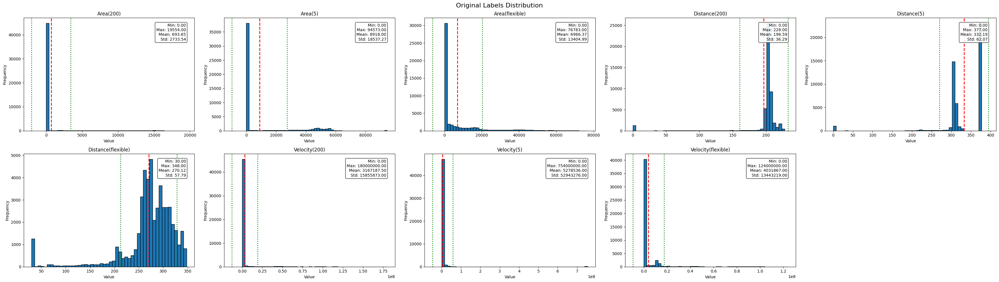

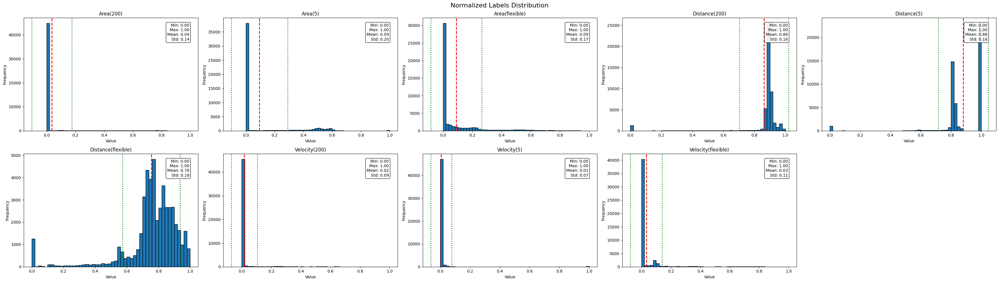

In [5]:
normalizer = EqualRangeNormalizer()
normalizer.fit(labels, label_keys, viz=True)
label_min, label_max = normalizer.min_vals, normalizer.max_vals
normalized_data = normalizer.transform(labels, label_keys, viz=True)

output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
with h5py.File(output_file, 'a') as h5:
    # h5.create_dataset('merged_labels_min', data=label_min, dtype=np.float32)
    # h5.create_dataset('merged_labels_max', data=label_max, dtype=np.float32)
    # h5.create_dataset('merged_labels_normalized', data=normalized_data, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics_min', data=label_min, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics_max', data=label_max, dtype=np.float32)
    h5.create_dataset('merged_plume_metrics_normalized', data=normalized_data, dtype=np.float32)

#### verify if it's recoverable

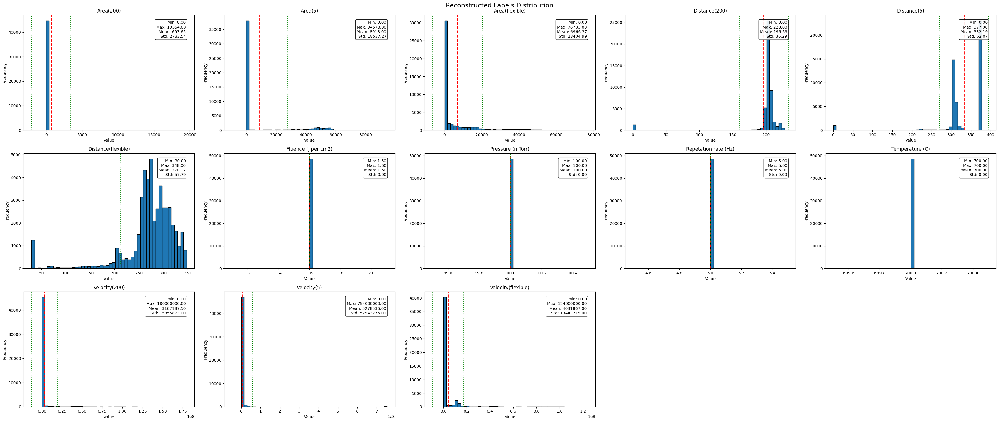

In [8]:
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
with h5py.File(output_file, 'r') as h5:
    merged_labels_min = np.array(h5['merged_labels_min'])
    merged_labels_max = np.array(h5['merged_labels_max'])
    merged_labels_normalized = np.array(h5['merged_labels_normalized'])
    merged_labels_min = np.array(h5['merged_labels_min'])
    merged_labels_max = np.array(h5['merged_labels_max'])
    merged_labels_normalized = np.array(h5['merged_labels_normalized'])

normalizer = EqualRangeNormalizer(min_vals=merged_labels_min, max_vals=merged_labels_max)
merged_labels = normalizer.inverse_transform(merged_labels_normalized, label_keys, viz=True)

## CNN for regression

In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.models import resnet18
from torchvision import datasets, transforms, models
import matplotlib.image as image
import h5py

import sys
sys.path.append('../../../src/DL')
sys.path.append('../../../src')
from viz import show_images
from hdf5_dataset import hdf5_dataset_image
from build_model import resnet34_
from trainer import ModelTrainer

In [2]:
with h5py.File('D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5', 'r') as h5:
    print(h5.keys())    
    print(h5['images'].shape)

<KeysViewHDF5 ['Area(200)', 'Area(5)', 'Area(flexible)', 'Distance(200)', 'Distance(5)', 'Distance(flexible)', 'Fluence (J per cm2)', 'Growth', 'Pressure (mTorr)', 'Repetation rate (Hz)', 'Temperature (C)', 'Velocity(200)', 'Velocity(5)', 'Velocity(flexible)', 'images', 'merged_labels', 'merged_labels_max', 'merged_labels_min', 'merged_labels_normalized', 'plume_index', 'time_index']>
(48640, 250, 400)


In [32]:
bs = 128
num_workers = 2

# imagenet
plume_ds = hdf5_dataset_image('D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5', transform=transforms.ToTensor(),
                        data_key='images', label_key='merged_labels_normalized')
train_ds, valid_ds = torch.utils.data.random_split(plume_ds, [int(0.8*len(plume_ds)), len(plume_ds)-int(0.8*len(plume_ds))])
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=num_workers)
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=num_workers)

batch = next(iter(train_dl))
images, labels = batch
print(images.shape, labels.shape, labels)

torch.Size([128, 1, 250, 400]) torch.Size([128, 13]) tensor([[0.0000e+00, 3.5951e-04, 1.0810e-03,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 4.2295e-04, 2.9538e-02,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 3.4894e-04, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [1.0228e-04, 5.5463e-01, 8.8327e-02,  ..., 0.0000e+00, 0.0000e+00,
         1.1290e-01],
        [0.0000e+00, 2.7492e-04, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 3.0664e-04, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


In [3]:
model = resnet34_(in_channels=1, n_classes=13)
outputs = model(images)
print(outputs.shape, labels.shape)

NameError: name 'images' is not defined

In [46]:
device = torch.device('cuda:0')
lr = 1e-4
start = 100
epochs = 10
# model = nn.parallel.DataParallel(model, device_ids=[0, 1]).to(device)

def custom_loss_calculator(outputs, inputs, labels):
    losses = {}
    total_loss = F.mse_loss(outputs, labels)
    losses['Total_loss'] = total_loss
    return losses

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
scheduler = torch.optim.lr_scheduler.OneCycleLR(optimizer, epochs=epochs, max_lr=lr, steps_per_epoch=len(train_dl))

trainer = ModelTrainer(model, custom_loss_calculator, optimizer, device, scheduler)
history = trainer.train_epochs(train_dl, valid_dl_list=[valid_dl], valid_name_list=['validation'], 
                               epochs=epochs, model_dir='../../../datasets/plume_describer/')

Epoch: 1/10


100%|██████████| 304/304 [02:36<00:00,  1.94it/s]


Training:
  Total_loss: 1.6516e-05


100%|██████████| 76/76 [00:22<00:00,  3.39it/s]


validation:
  Total_loss: 8.9523e-06
Epoch: 2/10


100%|██████████| 304/304 [02:35<00:00,  1.96it/s]


Training:
  Total_loss: 1.7623e-05


100%|██████████| 76/76 [00:21<00:00,  3.50it/s]


validation:
  Total_loss: 1.1924e-05
Epoch: 3/10


100%|██████████| 304/304 [02:24<00:00,  2.10it/s]


Training:
  Total_loss: 1.8633e-05


100%|██████████| 76/76 [00:21<00:00,  3.53it/s]


validation:
  Total_loss: 1.1477e-05
Epoch: 4/10


100%|██████████| 304/304 [02:23<00:00,  2.11it/s]


Training:
  Total_loss: 1.8375e-05


100%|██████████| 76/76 [00:21<00:00,  3.55it/s]


validation:
  Total_loss: 1.1134e-05
Epoch: 5/10


100%|██████████| 304/304 [02:25<00:00,  2.09it/s]


Training:
  Total_loss: 1.8213e-05


100%|██████████| 76/76 [00:21<00:00,  3.52it/s]


validation:
  Total_loss: 1.0550e-05
Epoch: 6/10


100%|██████████| 304/304 [01:54<00:00,  2.66it/s]


Training:
  Total_loss: 1.7500e-05


100%|██████████| 76/76 [00:20<00:00,  3.62it/s]


validation:
  Total_loss: 9.6960e-06
Epoch: 7/10


100%|██████████| 304/304 [01:50<00:00,  2.75it/s]


Training:
  Total_loss: 1.6943e-05


100%|██████████| 76/76 [00:20<00:00,  3.63it/s]


validation:
  Total_loss: 8.9104e-06
Epoch: 8/10


100%|██████████| 304/304 [01:50<00:00,  2.76it/s]


Training:
  Total_loss: 1.6556e-05


100%|██████████| 76/76 [00:21<00:00,  3.62it/s]


validation:
  Total_loss: 9.3408e-06
Epoch: 9/10


100%|██████████| 304/304 [01:50<00:00,  2.75it/s]


Training:
  Total_loss: 1.5923e-05


100%|██████████| 76/76 [00:20<00:00,  3.64it/s]


validation:
  Total_loss: 9.0680e-06
Epoch: 10/10


100%|██████████| 304/304 [01:50<00:00,  2.75it/s]


Training:
  Total_loss: 1.5859e-05


100%|██████████| 76/76 [00:20<00:00,  3.63it/s]

validation:
  Total_loss: 9.1691e-06


In [48]:
history['epoch']

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9]

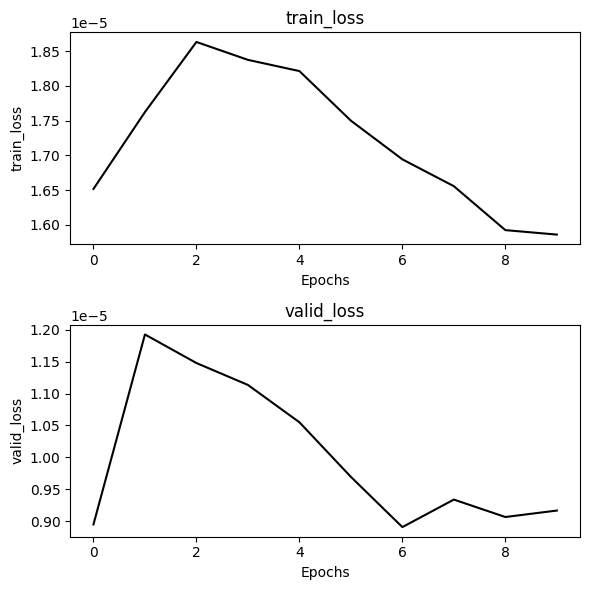

In [51]:
train_loss = [item.item() for item in history['train_Total_loss']]
valid_loss = [item.item() for item in history['validation_Total_loss']]
trainer = ModelTrainer(model, custom_loss_calculator, optimizer, device, scheduler)

metrics_dict = {'train_loss': train_loss, 'valid_loss': valid_loss}
trainer.plot_training_metrics(history['epoch'], metrics_dict)

In [60]:
torch.save(model.cpu().state_dict(), '../../../datasets/plume_describer/best_model.pt')

### valid

In [6]:
%load_ext autoreload
%autoreload 2

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import glob
import h5py
import random

import sys
sys.path.append('../../../src')
from viz import show_images
from Velocity import VelocityCalculator

sys.path.append('../../../src/DL')
from make_dataset import EqualRangeNormalizer, merge_h5_and_csv

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
output_file = 'D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5'
with h5py.File(output_file, 'r') as h5:
    merged_labels_min = np.array(h5['merged_labels_min'])
    merged_labels_max = np.array(h5['merged_labels_max'])
    label_keys = list(h5.attrs['label_keys'])
    print(h5.attrs['label_keys'])
normalizer = EqualRangeNormalizer(min_vals=merged_labels_min, max_vals=merged_labels_max)\

bs = 16
num_workers = 0
plume_ds = hdf5_dataset_image('D:/pld_plumes/SRO_STO_Drexel/PlumeDataset_YG045_YG063.h5', transform=transforms.ToTensor(),
                        data_key='images', label_key='merged_labels_normalized')
train_ds, valid_ds = torch.utils.data.random_split(plume_ds, [int(0.8*len(plume_ds)), len(plume_ds)-int(0.8*len(plume_ds))])
train_dl = DataLoader(train_ds, batch_size=bs, shuffle=True, num_workers=num_workers)
valid_dl = DataLoader(valid_ds, batch_size=bs, shuffle=False, num_workers=num_workers)

batch = next(iter(train_dl))
images, labels = batch
print(images.shape, labels.shape, labels)

['Area(200)' 'Area(5)' 'Area(flexible)' 'Distance(200)' 'Distance(5)'
 'Distance(flexible)' 'Fluence (J per cm2)' 'Pressure (mTorr)'
 'Repetation rate (Hz)' 'Temperature (C)' 'Velocity(200)' 'Velocity(5)'
 'Velocity(flexible)']
torch.Size([16, 1, 250, 400]) torch.Size([16, 13]) tensor([[3.5798e-04, 5.8309e-01, 8.1203e-02, 8.9035e-01, 1.0000e+00, 6.2264e-01,
         5.0000e-01, 5.0000e-01, 5.0000e-01, 5.0000e-01, 0.0000e+00, 0.0000e+00,
         1.1290e-01],
        [0.0000e+00, 4.9697e-04, 4.4671e-03, 9.1228e-01, 1.0000e+00, 7.3585e-01,
         5.0000e-01, 5.0000e-01, 5.0000e-01, 5.0000e-01, 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 2.2205e-04, 0.0000e+00, 8.8158e-01, 8.0902e-01, 8.5535e-01,
         5.0000e-01, 5.0000e-01, 5.0000e-01, 5.0000e-01, 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 5.0754e-04, 4.9217e-02, 9.0789e-01, 8.3289e-01, 7.3585e-01,
         5.0000e-01, 5.0000e-01, 5.0000e-01, 5.0000e-01, 0.0000e+00, 0.0000e+00,
       

In [18]:
device = torch.device('cuda:0')
model = resnet34_(in_channels=1, n_classes=13)
model.load_state_dict(torch.load('../../../datasets/plume_describer/best_model.pt'))
loss_func = nn.MSELoss()

batch = next(iter(train_dl))
images, labels = batch
images = images.to(device)
model = model.to(device)
predictions = model(images).detach().cpu().numpy()

labels = labels.to(device).cpu().numpy()
labels = normalizer.inverse_transform(labels, label_keys, viz=False)
predictions = normalizer.inverse_transform(predictions, label_keys, viz=False)

distance, area = labels[:, 5], labels[:, 2]
distance_pred, area_pred = predictions[:, 5], predictions[:, 2]

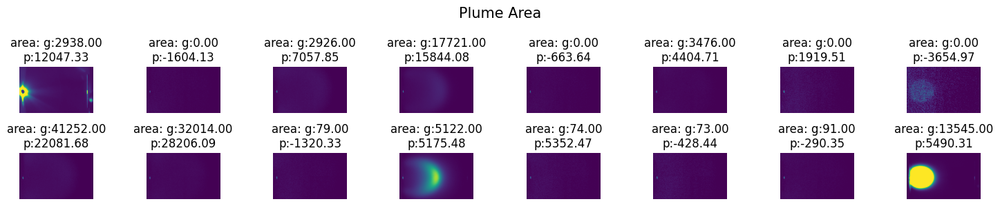

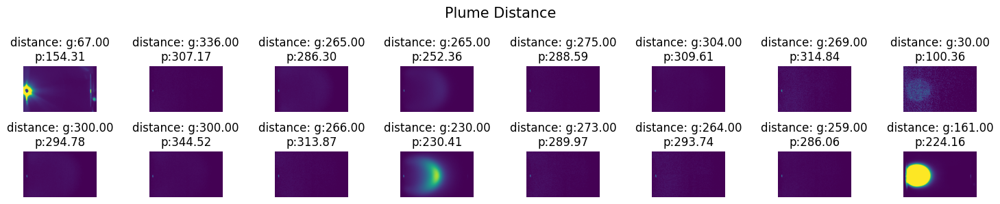

In [19]:
labels = [f'area: g:{area[index]:.2f}\np:{area_pred[index]:.2f}' for index in range(len(labels))]
show_images(images.cpu().squeeze().numpy(), img_per_row=8, img_height=1, labels=labels, title='Plume Area')
plt.tight_layout()
plt.show()

labels = [f'distance: g:{distance[index]:.2f}\np:{distance_pred[index]:.2f}' for index in range(len(labels))]
show_images(images.cpu().squeeze().numpy(), img_per_row=8, img_height=1, labels=labels, title='Plume Distance')
plt.tight_layout()
plt.show()

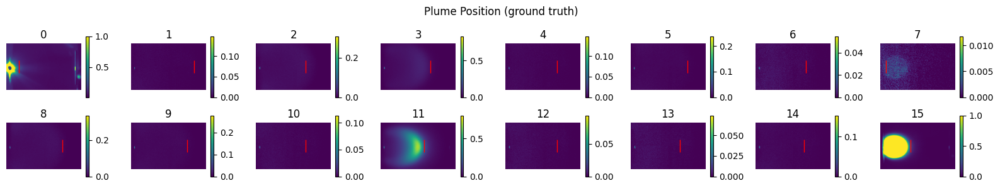

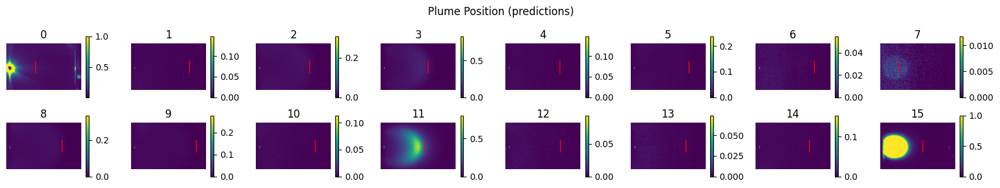

In [20]:
coords_standard = np.load('../../../datasets/frame_normalization_coords/standard_coords.npy')
start_position = np.round(np.mean(coords_standard[:2], axis=0)).astype(np.int32) # start position of plume  (x, y)
position_range = np.min(coords_standard[:,0]), np.max(coords_standard[:,0]) # x position range
ys = np.ones_like(distance) * 125
positions = np.stack([distance, ys], axis=-1)
positions_pred = np.stack([distance_pred, ys], axis=-1)

V = VelocityCalculator(time_interval=500e-9, start_position=start_position, position_range=position_range, threshold='flexible')
V.visualize_plume_positions(images.cpu().squeeze().numpy(), positions, label_time=False, title='Plume Position (ground truth)')
V.visualize_plume_positions(images.cpu().squeeze().numpy(), positions_pred, label_time=False, title='Plume Position (predictions)')

torch.Size([4, 5]) torch.Size([4, 5]) torch.Size([4, 34, 1, 250, 400]) torch.Size([4, 34, 1, 250, 400])


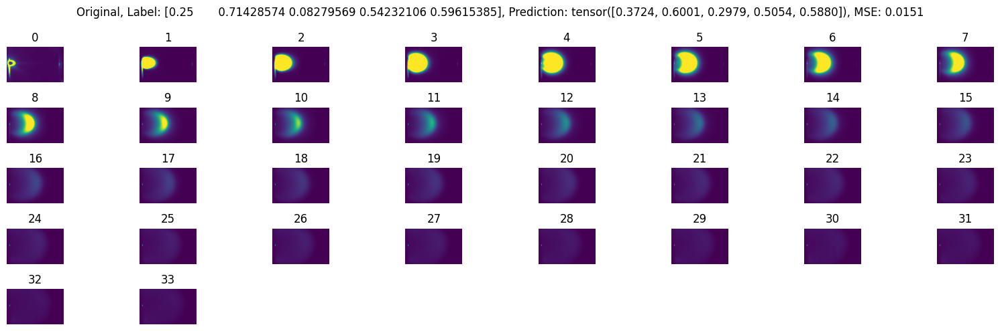

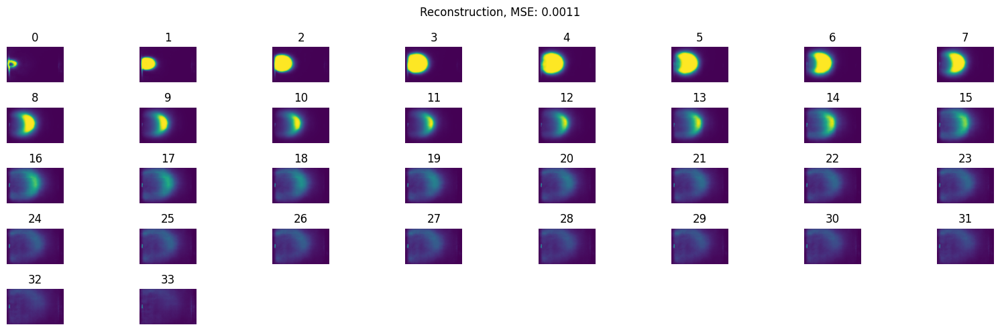

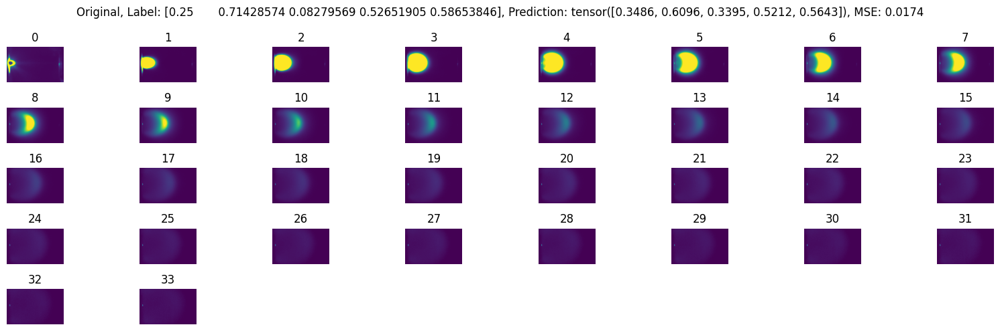

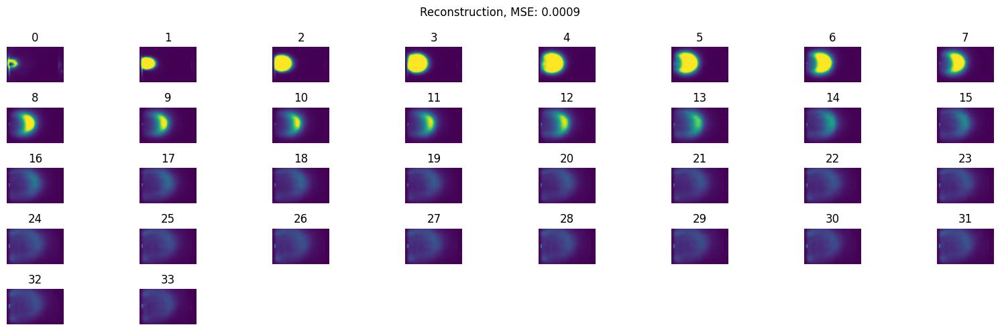

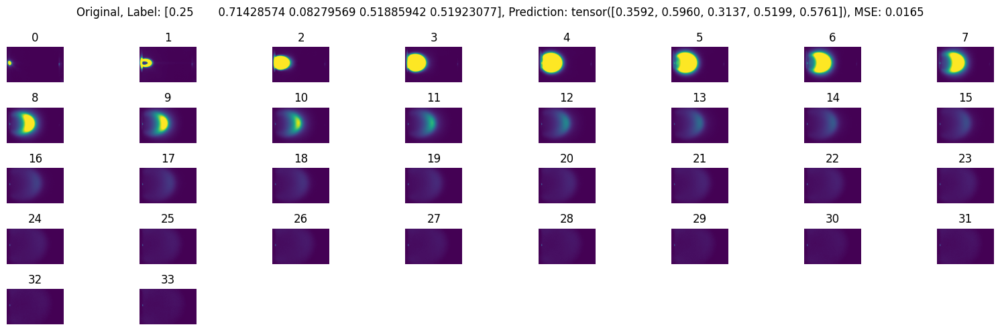

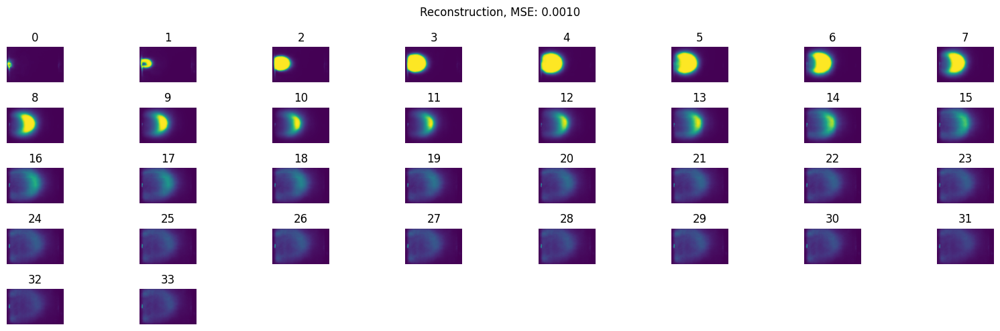

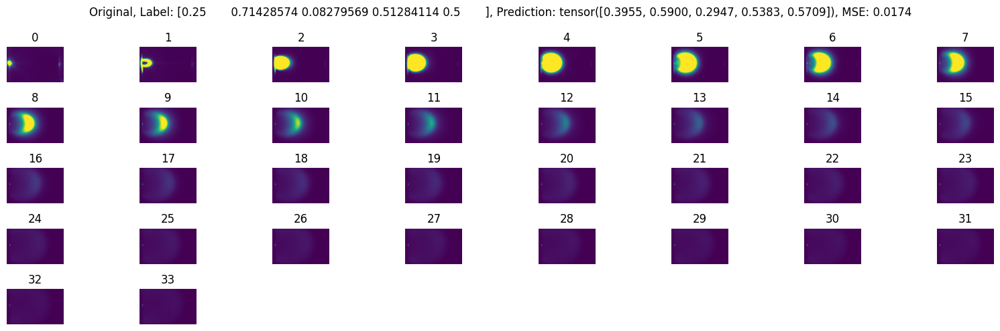

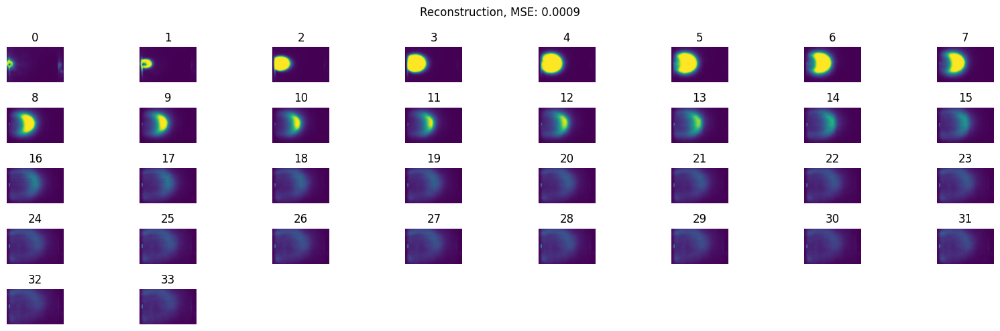

In [14]:
device = torch.device('cuda:0')
loss_func = nn.MSELoss()

batch = next(iter(valid_dl))
images, labels = batch
images = images.to(device)
labels = labels.to(device)
model = model.to(device)
gr, reconstructed = model(images)
# images = images.squeeze().cpu().numpy()
# reconstructed = reconstructed.squeeze().cpu().detach().numpy()
print(gr.shape, labels.shape, images.shape, reconstructed.shape)

for i in range(len(images)):
    title = f'Original, Label: {labels[i].cpu().numpy()}, Prediction: {gr[i].detach().cpu()}, MSE: {nn.MSELoss()(gr[i], labels[i]).item():.4f}'
    show_images(images.squeeze().cpu().numpy()[i], title=title)
    plt.show()
    
    title = f'Reconstruction, MSE: {loss_func(reconstructed[i], images[i]).item():.4f}'
    show_images(reconstructed.squeeze().detach().cpu().numpy()[i], title=title)
    plt.show()